In [102]:
import torch
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

from scarches.models import scPoli

sc.settings.set_figure_params(dpi=300, frameon=False)
plt.rcParams['figure.figsize'] = (5, 5)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

%load_ext autoreload
%config InlineBackend.figure_formats = ['pdf']
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [63]:
adata_counts = sc.read(
    '../../../lataq_reproduce_backup/lataq_reproduce/data/hlca_counts_commonvars.h5ad'
)

In [64]:
adata_counts

AnnData object with n_obs × n_vars = 584884 × 1897
    obs: 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'sample', 'study', 'subject_ID', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_

In [65]:
sc.pl.umap(adata_counts, color='ann_level_4')

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 2500x2500 with 1 Axes>

In [66]:
sc.pl.umap(adata_counts, color='ann_finest_level')

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 2500x2500 with 1 Axes>

In [67]:
adata_counts.obs.columns

Index(['is_primary_data', 'assay_ontology_term_id',
       'cell_type_ontology_term_id', 'development_stage_ontology_term_id',
       'disease_ontology_term_id', 'ethnicity_ontology_term_id',
       'tissue_ontology_term_id', 'organism_ontology_term_id',
       'sex_ontology_term_id', 'sample', 'study', 'subject_ID',
       'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type',
       '3'_or_5'', 'sequencing_platform', 'cell_ranger_version',
       'fresh_or_frozen', 'dataset', 'anatomical_region_level_2',
       'anatomical_region_level_3', 'anatomical_region_highest_res', 'age',
       'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts',
       'mito_frac', 'ribo_frac', 'original_ann_level_1',
       'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4',
       'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label',
       'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score',
       'entropy_study_leiden_3', 'en

In [68]:
adata_counts.obs.groupby('subject_type')['dataset'].value_counts()

subject_type   dataset                  
alive_disease  Krasnow_2020                  60977
               Banovich_Kropski_2020             0
               Barbry_Leroy_2020                 0
               Jain_Misharin_2021_10Xv1          0
               Jain_Misharin_2021_10Xv2          0
               Lafyatis_Rojas_2019_10Xv1         0
               Lafyatis_Rojas_2019_10Xv2         0
               Meyer_2019                        0
               Misharin_2021                     0
               Misharin_Budinger_2018            0
               Nawijn_2021                       0
               Seibold_2020_10Xv2                0
               Seibold_2020_10Xv3                0
               Teichmann_Meyer_2019              0
alive_healthy  Barbry_Leroy_2020             74486
               Nawijn_2021                   70401
               Jain_Misharin_2021_10Xv2      33135
               Jain_Misharin_2021_10Xv1      12422
               Banovich_Kropski_2020     

In [69]:
from scipy.sparse import csr_matrix
adata = adata_counts.copy()
adata.X = csr_matrix(adata.X.astype('float32'))
adata.X = adata.X.A
adata.obs['ann_finest_level'] = adata.obs['ann_finest_level'].astype(str)
#adata.obs['ann_finest_level'][adata.obs['dataset'].str.contains('Krasnow')] = 'NA'

In [9]:
condition_key = 'sample'
cell_type_keys = ['ann_level_2', 'ann_finest_level']

In [10]:
labeled_indices = np.where(~adata.obs['dataset'].str.contains('Krasnow'))[0]

In [58]:
print('Initialize network')
scpoli_model = scPoli(
    adata=adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_keys,
    hidden_layer_sizes=[128]*3,
    latent_dim=25,
    embedding_dim=20,
    labeled_indices=labeled_indices,
    inject_condition=['encoder', 'decoder']
)


PARAMS = {                         #DATA USED FOR THE EXPERIMENT
    'EARLY_STOPPING_KWARGS': {                         #KWARGS FOR EARLY STOPPING
        "early_stopping_metric": "val_prototype_loss",  ####value used for early stopping
        "mode": "min",                                 ####choose if look for min or max
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    'LABELED_LOSS_METRIC': 'dist',           
    'UNLABELED_LOSS_METRIC': 'dist',
    'LATENT_DIM': 50,
    'ALPHA_EPOCH_ANNEAL': 1e4,
    'CLUSTERING_RES': 2,
    'HIDDEN_LAYERS': 4,
    'ETA': 5,
}

Initialize network
Embedding dictionary:
 	Num conditions: 166
 	Embedding dim: 20
Encoder Architecture:
	Input Layer in, out and cond: 1897 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 25
Decoder Architecture:
	First Layer in, out and cond:  25 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 1897 



In [59]:
scpoli_model.train(
    n_epochs=25, 
    pretraining_epochs=20,
    eta=5, 
    alpha_epoch_anneal=10000, 
    train_frac=1, 
    use_early_stopping=False, 
    unlabeled_prototype_training=False
)

Preparing (584884, 1897)
Splitting data (584884, 1897)
Instantiating dataset
The missing labels are: {'NA'}
Therefore integer value of those labels is set to -1
Preparing (584884, 1897)
Splitting data (584884, 1897)
Instantiating dataset
The missing labels are: {'NA'}
Therefore integer value of those labels is set to -1
Initializing dataloaders
Starting training
 |████████████████████| 100.0% 


In [69]:
scpoli_model.save('HLCA_final', overwrite=True)

In [11]:
scpoli_model = scPoli.load('HLCA_final', adata=adata)

AnnData object with n_obs × n_vars = 584884 × 1897
    obs: 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'sample', 'study', 'subject_ID', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_

In [70]:
target_adata = adata[adata.obs['dataset'].str.contains('Krasnow')]
results_dict = scpoli_model.classify(
    target_adata.X,
    target_adata.obs[condition_key],
)

In [71]:
results_dict[cell_type_keys[1]]

{'preds': array(['NK cells', 'Alveolar Mφ CCL3+', 'Suprabasal',
        'EC venous pulmonary', 'CD8 T cells', 'CD4 T cells',
        'Alveolar macrophages', ..., 'CD4 T cells', 'Alveolar macrophages',
        'Pericytes', 'Suprabasal', 'Alveolar Mφ CCL3+', 'AT2',
        'EC aerocyte capillary'], dtype='<U28'),
 'uncert': array([0.11, 0.25, 0.92, 0.1 , 0.13, 0.09, 0.13, ..., 0.11, 0.18, 0.07,
        0.65, 0.12, 0.1 , 0.16], dtype=float32),
 'weighted_distances': array([[3.72, 3.94, 3.21, 3.57, 3.17, 3.77, 1.45, ..., 3.66, 4.38, 3.53,
         1.46, 3.95, 4.35, 3.52],
        [3.85, 2.73, 0.5 , 2.75, 2.29, 3.47, 3.31, ..., 3.21, 4.13, 4.03,
         3.26, 3.4 , 3.68, 2.89],
        [3.15, 2.15, 2.27, 1.51, 0.92, 3.  , 2.96, ..., 2.  , 3.06, 3.44,
         2.95, 2.84, 3.23, 3.04],
        [3.02, 2.94, 3.45, 3.59, 3.19, 0.75, 4.25, ..., 3.93, 4.73, 3.93,
         4.29, 3.29, 3.09, 3.94],
        [3.83, 3.73, 3.1 , 3.27, 2.94, 3.96, 0.13, ..., 3.43, 4.19, 3.18,
         0.33, 3.72, 4.37, 

In [72]:
for i in range(len(cell_type_keys)):
    print(cell_type_keys[i])
    preds = results_dict[cell_type_keys[i]]["preds"]
    results_dict[cell_type_keys[i]]["uncert"]
    classification_df = pd.DataFrame(
        classification_report(
            y_true=target_adata.obs[cell_type_keys[i]],
            y_pred=preds,
            output_dict=True,
        )
    ).transpose()
    print(classification_df)


ann_level_2
                     precision    recall  f1-score      support
Airway epithelium     0.993197  0.747185  0.852804   3908.00000
Alveolar epithelium   0.847376  0.996703  0.915993   5459.00000
Blood vessels         0.998391  0.999690  0.999040  16143.00000
Fibroblast lineage    0.993185  0.570757  0.724921   3830.00000
Lymphatic EC          0.991398  0.995680  0.993534    463.00000
Lymphoid              0.987497  0.979204  0.983333  10002.00000
Mesothelium           0.126214  0.787879  0.217573     33.00000
Myeloid               0.999243  0.992927  0.996075  19936.00000
Smooth muscle         0.414747  0.995745  0.585586   1175.00000
Submucosal Gland      0.870968  0.964286  0.915254     28.00000
accuracy              0.950490  0.950490  0.950490      0.95049
macro avg             0.822222  0.903006  0.818411  60977.00000
weighted avg          0.970873  0.950490  0.953000  60977.00000
ann_finest_level


/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(aver

                              precision    recall  f1-score       support
AT1                            0.968032  0.966102  0.967066   1003.000000
AT2                            0.985998  0.984220  0.985108   4436.000000
AT2 proliferating              0.857143  0.900000  0.878049     20.000000
Adventitial fibroblasts        0.931677  0.874636  0.902256    343.000000
Alveolar Mφ CCL3+              0.543152  0.956266  0.692799   5785.000000
Alveolar Mφ MT-positive        0.100000  0.142857  0.117647      7.000000
Alveolar Mφ proliferating      0.762821  0.601010  0.672316    198.000000
Alveolar fibroblasts           0.918458  0.954038  0.935910   1523.000000
Alveolar macrophages           0.926743  0.459114  0.614032   8597.000000
B cells                        0.983806  0.983806  0.983806    247.000000
Basal resting                  0.718254  0.760504  0.738776    238.000000
CD4 T cells                    0.972523  0.881136  0.924577   2852.000000
CD8 T cells                    0.86539

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [73]:
len(results_dict['ann_finest_level']['preds'].tolist())

60977

In [74]:
len(adata_latent.obs['ann_finest_level_pred_plot'][adata_latent.obs['dataset'].str.contains('Krasnow')])

60977

In [75]:
adata_latent.obs['ann_finest_level_pred_plot'] = adata_latent.obs['ann_finest_level'].copy()
adata_latent.obs['ann_finest_level_pred_plot'][adata_latent.obs['dataset'].str.contains('Krasnow')] = results_dict['ann_finest_level']['preds'].tolist()

In [15]:
adata_sub = adata.copy()
#adata_sub = sc.pp.subsample(adata, n_obs=100000, copy=True)
data_latent = scpoli_model.get_latent(
    adata_sub.X.astype('float32'), 
    adata_sub.obs[condition_key].values,
    mean=True,
)
adata_latent = sc.AnnData(data_latent)
adata_latent.obs = adata_sub.obs.copy()
sc.pp.neighbors(adata_latent)
sc.tl.umap(adata_latent)

In [100]:
adata_latent.write('HLCA_latent.h5ad')

In [76]:
sc.pl.umap(adata_latent, color='ann_finest_level', size=10)

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 2500x2500 with 1 Axes>

In [77]:
sc.pl.umap(adata_latent, color='ann_finest_level', size=2)

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 2500x2500 with 1 Axes>

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


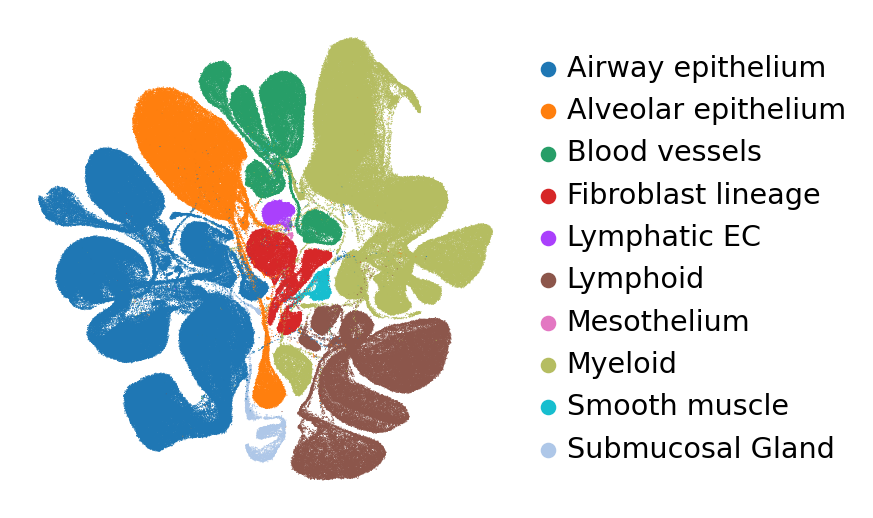

In [112]:
%config InlineBackend.figure_formats = ['pdf']
sc.settings.set_figure_params(dpi_save=300, frameon=False)
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_latent, color='ann_level_2', size=1, frameon=False, show=False, ax=ax)
ax.set_title('')
plt.savefig('pdfs/umap_ann_level_2.pdf', bbox_inches='tight')

In [92]:
adata_latent.obs['study'] = adata_latent.obs['study'].str.replace('_', '')

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


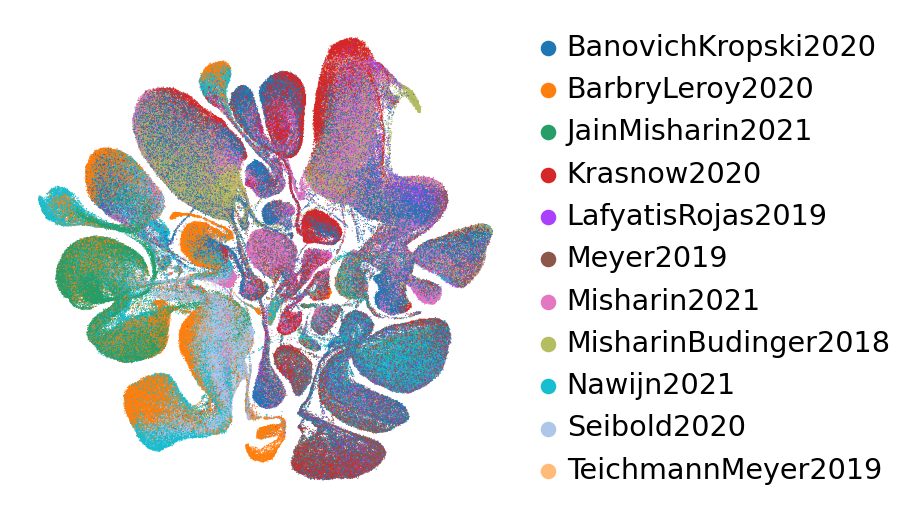

In [111]:
sc.settings.set_figure_params(dpi_save=300, frameon=False)
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_latent, color='study', size=1, frameon=False, show=False, ax=ax)
ax.set_title('')
plt.savefig('pdfs/umap_dataset.pdf', bbox_inches='tight')

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


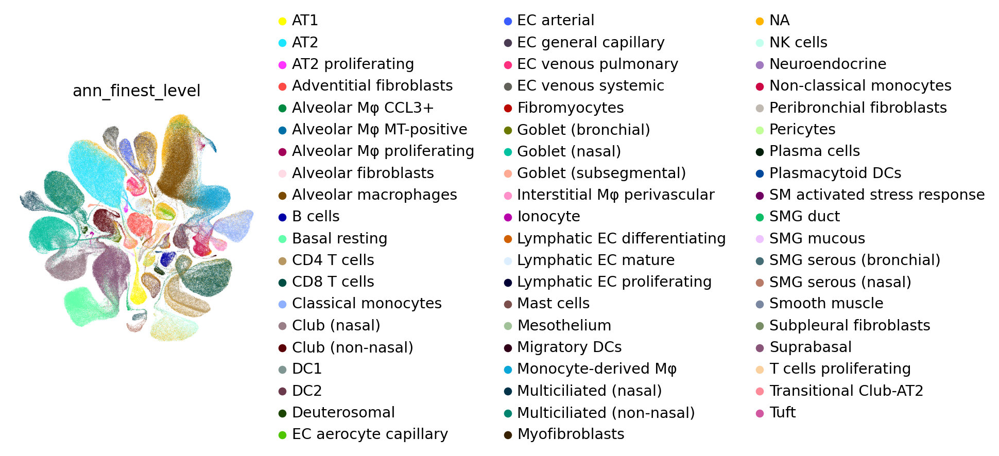

In [117]:
sc.pl.umap(
    adata_latent, 
    color='ann_finest_level',
)

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


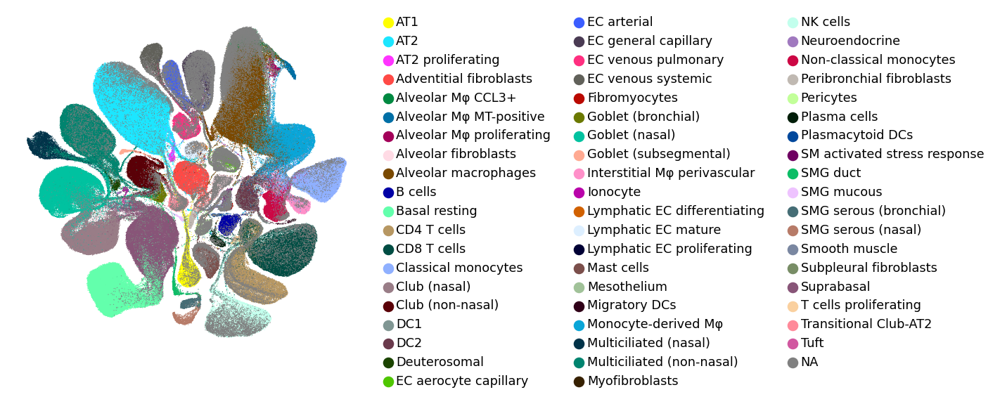

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(
    adata_latent[~adata_latent.obs.dataset.str.contains('Krasnow')], 
    color='ann_finest_level', 
    size=1,
    show=False,
    ax=ax,
    frameon=False
)
sc.pl.umap(
    adata_latent[adata_latent.obs.dataset.str.contains('Krasnow')], 
    color='ann_finest_level', 
    palette=['#808080'],
    size=1,
    show=False,
    ax=ax,
    frameon=False
)
ax.set_title('')
ax.legend(title='', bbox_to_anchor=(1.05, 1), loc=2, ncol=3, fontsize=8,  borderaxespad=0., frameon=False)
plt.savefig('pdfs/umap_ann_finest_level.pdf', bbox_inches='tight')

/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/icb/carlo.dedonno/anaconda3/envs/scarches/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


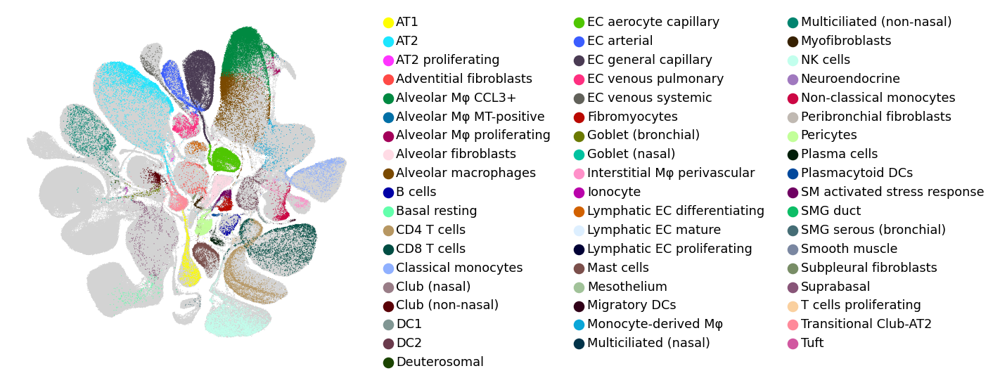

In [121]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
palette_dict = dict(
    zip(adata_latent.obs['ann_finest_level_pred_plot'].cat.categories, 
        adata_latent.uns['ann_finest_level_colors']))
sc.pl.umap(
    adata_latent[~adata_latent.obs.dataset.str.contains('Krasnow')], 
    size=1,
    show=False,
    ax=ax,
    frameon=False
)
sc.pl.umap(
    adata_latent[adata_latent.obs.dataset.str.contains('Krasnow')], 
    color='ann_finest_level_pred_plot', 
    palette=palette_dict,
    size=1,
    show=False,
    ax=ax,
    frameon=False
)
ax.set_title('')
ax.legend(title='', bbox_to_anchor=(1.05, 1), loc=2, ncol=3, fontsize=8,  borderaxespad=0., frameon=False)
plt.savefig('pdfs/umap_preds.pdf', bbox_inches='tight')